In [1]:
import pandas as pd
import numpy as np
from gensim import corpora
from gensim.models import LdaMulticore
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from wordcloud import WordCloud, ImageColorGenerator
import logging
import re
import os
import jieba
import datetime
import pyLDAvis.gensim

In [2]:
model = LdaMulticore.load(r"new_model\lda_500_18i50p_shuffle_ver2/lda_18i50p.model")

C:\Users\DA01020\anaconda3\envs\python_course\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### 讀取資料

In [3]:
#df = pd.read_csv('data/new_data.csv',encoding='utf-8',sep='{')
def load_data(path,sep):
    doc=pd.read_csv(path,encoding='utf-8',sep=sep)
    
    return doc
df = load_data(r'data/lstm_practice_data_all_0304.csv','{')

### 製作語料庫

In [24]:
#載入繁中辭典
jieba.set_dictionary('./dict.txt.big')
jieba.load_userdict('userdict.txt') 

def prepare_stop_words(path):
    with open(path,'r',encoding='utf-8') as f:
        stop_word = []
        stop_word_list =[word.strip() for word in f]
    return stop_word_list
stop_word_list = prepare_stop_words('stopwords.txt')

print('start of jieba_cut...')

def jieba_cut(doc):
    jieba_results = []
    start_time=datetime.datetime.now()
    for row in doc:
        w_list = jieba.lcut(row, cut_all=False) # 精確模式
        w_list = [w for w in w_list if (len(w)>1 and w not in stop_word_list)] #去除單個字的詞
        jieba_results.append(w_list)
    end_time=datetime.datetime.now()
    spent_time=end_time-start_time
    print(spent_time)
    return jieba_results
df['jieba'] = jieba_cut(df['內容'])

df_ = df.sample(frac=1,random_state=12)

def create_corpus(doc,no_below=10,no_above=0.9):
    print('Preparing dictionary...')
    dictionary = corpora.Dictionary(doc)
    # 刪除出現次數小於2的詞語 /刪除出現次數大於9成的詞語
    dictionary.filter_extremes(no_below=no_below, no_above=no_above)   
    # 去掉因刪除詞彙而出現的空白(重新設定word id)
    dictionary.compactify()
    print('Preparing corpus...')
    corpus = [dictionary.doc2bow(text) for text in doc]
    
    return dictionary, corpus
dictionary, corpus = create_corpus(df_['jieba'])

C:\Users\DA01020\anaconda3\envs\python_course\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Building prefix dict from C:\Users\DA01020\Desktop\project_code\dict.txt.big ...
Loading model from cache C:\Users\DA01020\AppData\Local\Temp\jieba.u44223867912e4a8092026e83185e9d64.cache
Loading model cost 1.145 seconds.
Prefix dict has been built successfully.


start of jieba_cut...
0:48:14.963693
Preparing dictionary...
Preparing corpus...


### 訓練LDA模型

In [6]:
def train_Lda(log_path,corpus,dictionary,passes,iterations,topic):
    logging.basicConfig(filename=log_path,
                    format="%(asctime)s:%(levelname)s:%(message)s",
                    level=logging.NOTSET)
    

    start_time = datetime.datetime.now()
    logging.debug(f'start : {topic}topic model')

    lda = LdaMulticore(corpus=corpus,
            id2word=dictionary,
            num_topics=topic,
            passes=passes,
            iterations=iterations,
            eval_every=100,
            random_state=100,
            workers=3)

    logging.debug(f'end : {topic}topic model')

    #save the model
    if not os.path.exists(f'lda_model_{topic}_topic'):
        os.makedirs(f'lda_model_{topic}_topic')

        lda.save(f'lda_model_{topic}_topic/lda_{topic}topic_{iterations}.model')

    end_time = datetime.datetime.now()
    spent_time = end_time-start_time
    print(spent_time)

    return lda

model = train_Lda('gensim_LDA.log',corpus,dictionary,20,500,18)

3:37:07.144959


### 查看模型結果

In [7]:
def get_prob(model,num_topics,corpus):
    start_time = datetime.datetime.now()
    
    doc_prob = np.array(model.get_document_topics(corpus,minimum_probability=0))[:,:,1]
    col=["Topic"+ str(n) for n in range(1,num_topics+1)]
    df_prob=pd.DataFrame(columns = col, data =doc_prob)
    
    end_time = datetime.datetime.now()
    spent_time = end_time-start_time
    print(spent_time)
    
    return df_prob
df_prob = get_prob(model,18,corpus)

0:29:55.515889


In [8]:
df_prob.describe()

,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18
count,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000,232492.000000
mean,0.072954,0.034350,0.024914,0.049282,0.031480,0.065580,0.081411,0.052687,0.053657,0.045428,0.092745,0.043299,0.056847,0.058044,0.045572,0.035859,0.080725,0.075166
std,0.137435,0.110155,0.083959,0.102971,0.108894,0.140752,0.163458,0.136810,0.124901,0.110826,0.185555,0.099131,0.127455,0.137069,0.146846,0.128150,0.173896,0.146049
min,0.000015,0.000011,0.000019,0.000011,0.000015,0.000027,0.000025,0.000015,0.000011,0.000033,0.000025,0.000015,0.000015,0.000011,0.000011,0.000011,0.000011,0.000015
25%,0.000357,0.000306,0.000302,0.000328,0.000308,0.000331,0.000325,0.000322,0.000325,0.000335,0.000326,0.000321,0.000340,0.000332,0.000296,0.000293,0.000327,0.000339
50%,0.000672,0.000449,0.000440,0.000551,0.000453,0.000553,0.000586,0.000496,0.000531,0.000568,0.000571,0.000531,0.000536,0.000523,0.000432,0.000416,0.000535,0.000599
75%,0.083008,0.001113,0.001012,0.046164,0.001548,0.059195,0.081700,0.023347,0.037183,0.035432,0.092120,0.035500,0.041281,0.041912,0.001736,0.000723,0.065762,0.081285
max,0.991760,0.987233,0.976179,0.882830,0.991784,0.993196,0.993482,0.994717,0.967417,0.993296,0.998301,0.935624,0.943762,0.994307,0.992660,0.993392,0.995338,0.987569


In [3]:
def get_term_in_topics(model,num_topics):
    word_in_topics = []
    for t in range(num_topics):
        topic = model.show_topic(t,1500) #每個主題取1500個字
        word = []
        for w in topic:
            word.append(w[0])        
        word_in_topics.append(word)
        word_in_topics_array = np.array(word_in_topics).T
           
    col=["Topic"+ str(n) for n in range(1,num_topics+1)]
    df_topic_words = pd.DataFrame(data=word_in_topics_array,columns=col)
    return df_topic_words
df_term = get_term_in_topics(model,18)
df_term.head(10)

C:\Users\DA01020\anaconda3\envs\python_course\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18
0,防疫,紓困,日本,口罩,活動,業者,病毒,經濟,今年,球員,台灣,旅客,確診,網友,企業,確診,疫苗,中國
1,口罩,申請,宣布,民眾,今年,旅遊,醫院,市場,億元,聯盟,防疫,武漢,個案,影片,科技,病例,研發,美國
2,學生,政府,決定,防疫,舉辦,觀光,感染,指數,影響,比賽,政府,中國,隔離,工作,服務,新增,試驗,川普
3,消毒,補助,取消,購買,民眾,推出,患者,美元,成長,賽事,國家,大陸,指揮中心,希望,發展,死亡,臨床,報導
4,學校,方案,東京,藥局,文化,消費,醫療,全球,營收,今年,國際,入境,症狀,臉書,提供,累計,檢測,總統
5,民眾,振興,延期,警方,媽祖,市場,研究,投資,需求,球隊,總統,機場,陳時中,家人,網路,人數,接種,國家
6,措施,萬元,影響,物資,影響,餐廳,醫師,美國,市場,選手,社會,航空,居家檢疫,在家,產業,感染,美國,指出
7,市府,企業,舉行,醫療,參加,影響,治療,投資人,第季,影響,全球,航班,中央流行疫情指揮中心,孩子,平台,報導,藥物,全球
8,中央,勞工,報導,酒精,台灣,飯店,出現,台股,大陸,NBA,國民黨,旅遊,感染,分享,數位,國家,抗體,經濟
9,配合,億元,日本政府,訊息,台北,消費者,發現,下跌,公司,進行,強調,人員,檢疫,時間,全球,冠狀病毒,公司,拜登


C:\Users\DA01020\anaconda3\envs\python_course\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


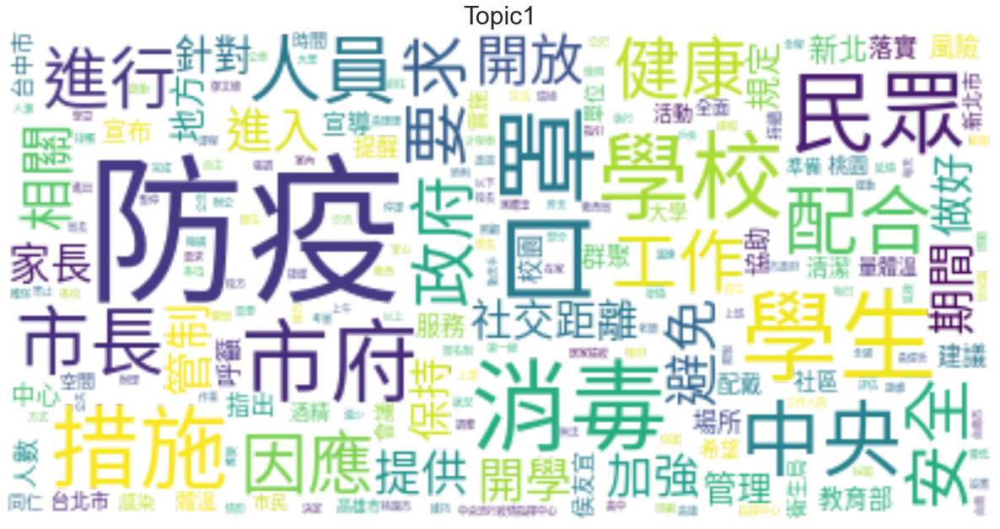

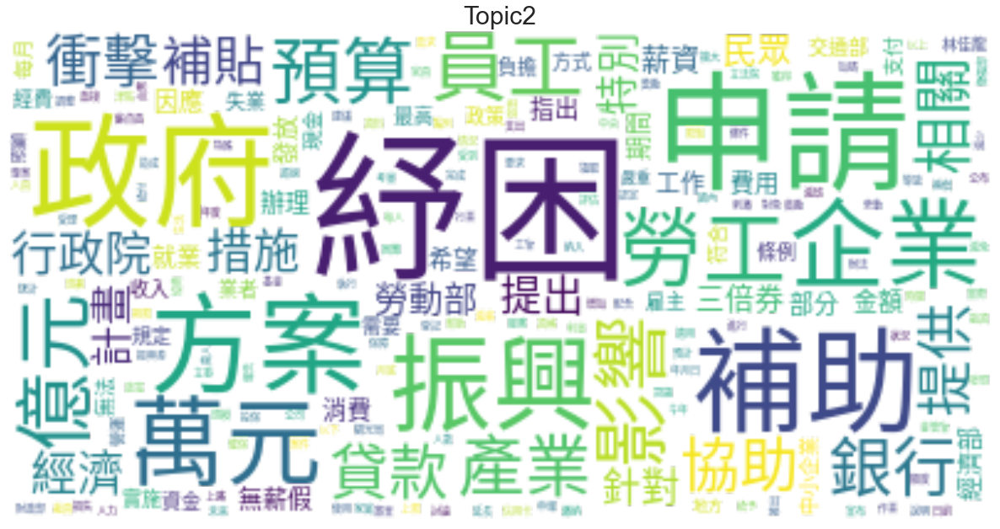

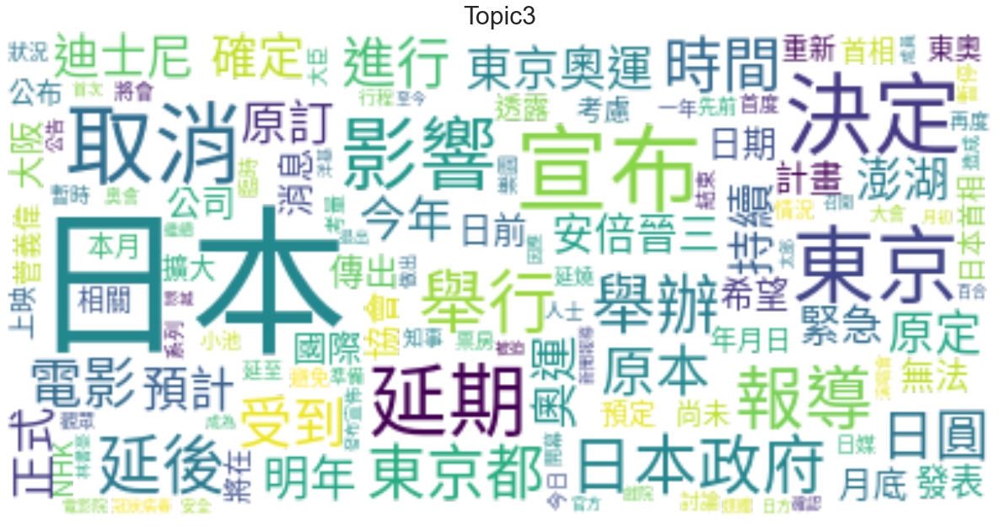

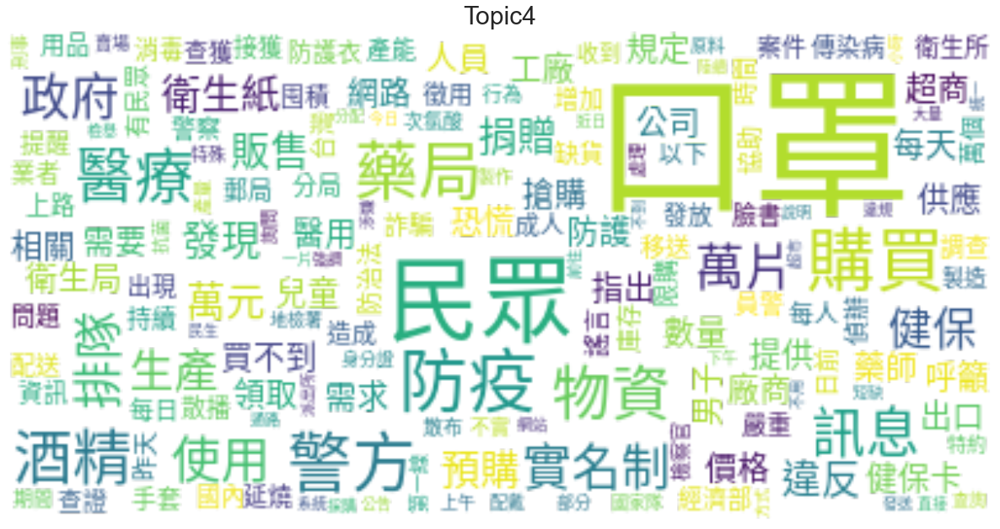

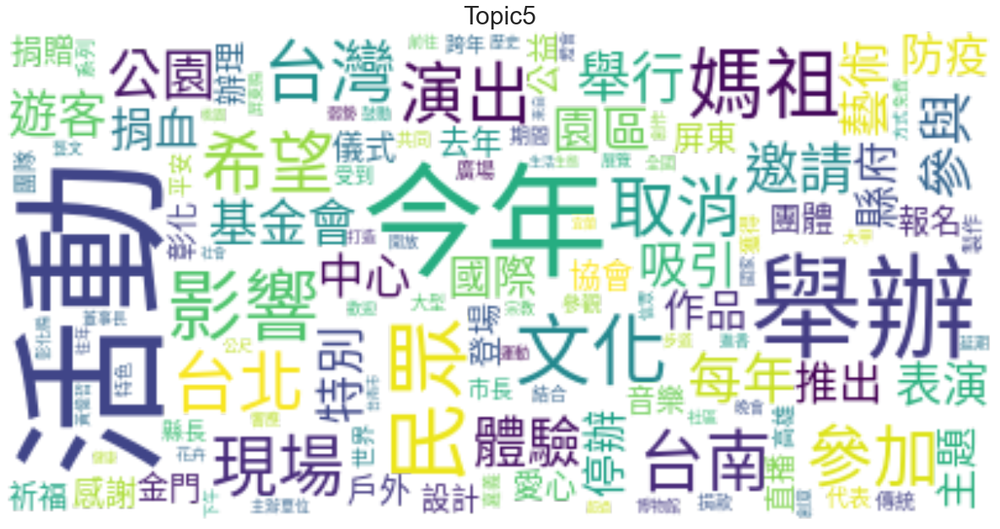

...

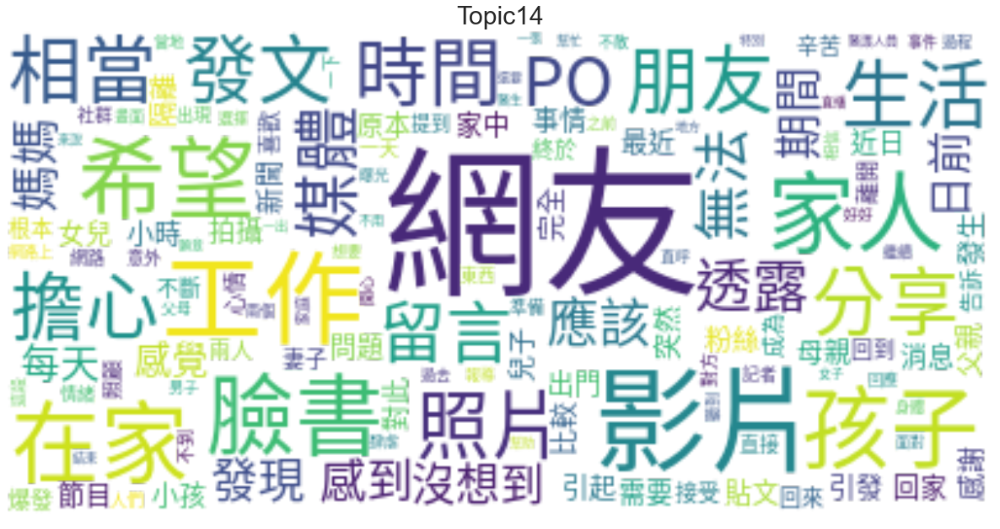

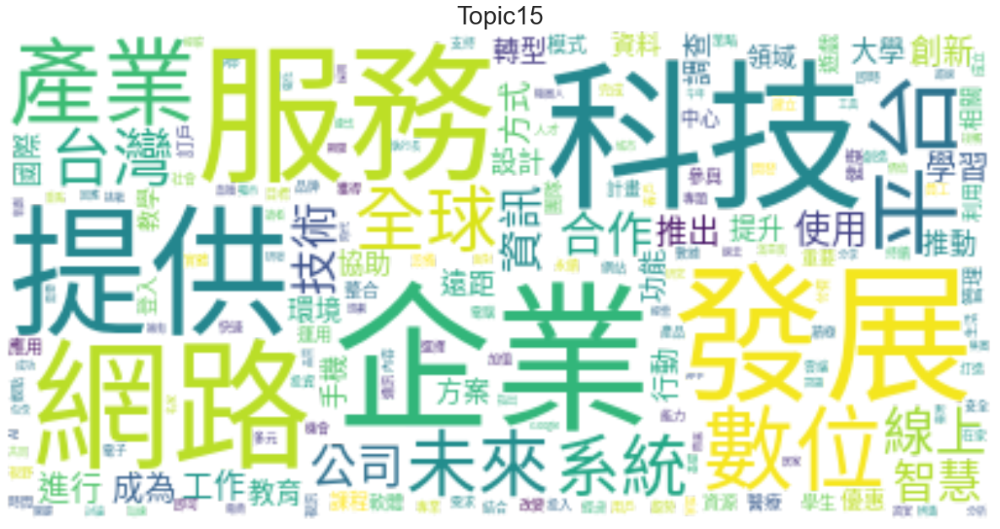

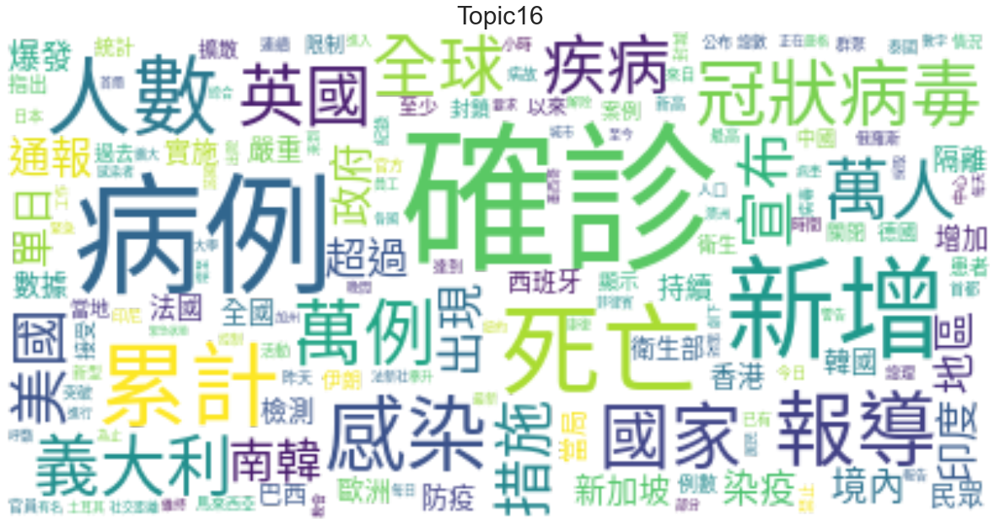

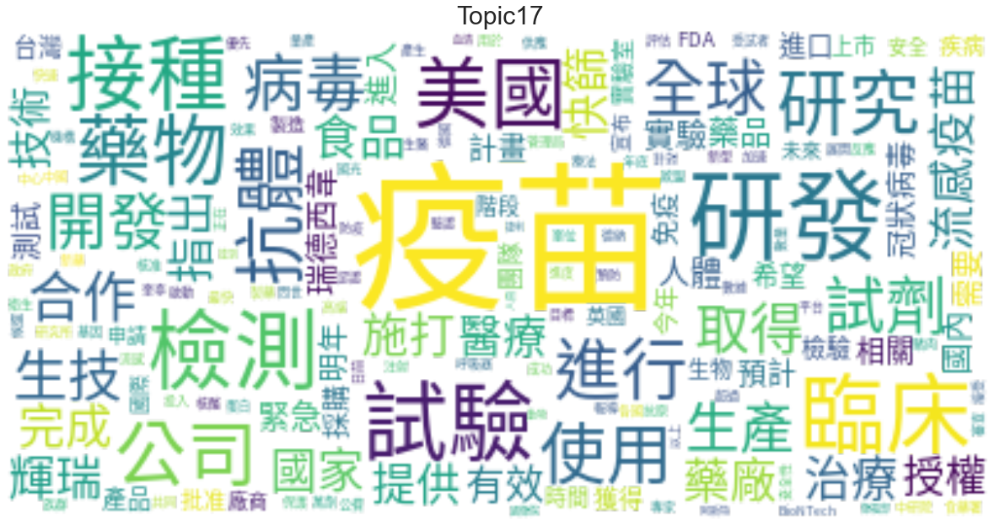

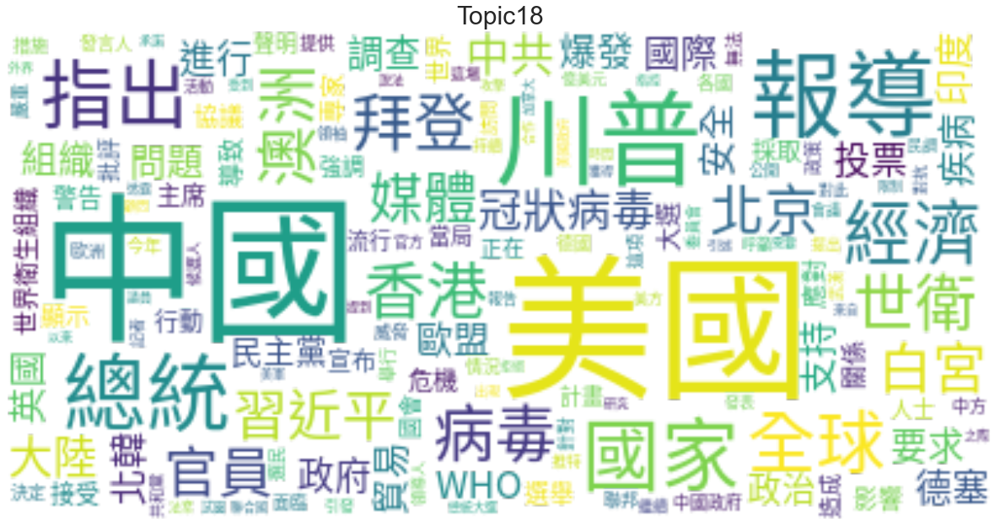

In [4]:
def get_word_cloud(model,num_topics):
    #準備文字雲的文字&權重
    for t in range(num_topics):
        topic_term = []
        topic = model.show_topic(t,2000) #每個主題取1500個字

        for w in topic:

            weight = int(w[1]*1000)           
            
            #將文字加入list中 -->次數依權重(機率)而定
            for n in range(weight):
                topic_term.append(w[0])
                
        words = Counter(topic_term)
        
        wc_news = WordCloud(background_color=None, mode='RGBA', #透明背景
                          max_words=2000,
                          max_font_size=65,
                          font_path='SourceHanSansTC-Regular.otf'
                         )
        wc_news.generate_from_frequencies(words)
        
        plt.figure(figsize = (21,12))
        sns.set_style("whitegrid")
        plt.title(f'Topic{t+1}', fontsize=30)
        plt.imshow(wc_news, interpolation='bilinear')
        plt.axis("off")
        
        #儲存文字雲
        plt.savefig(f'lda_model_{num_topics}_topic/{num_topics}_Topic_{t+1}.png')

        plt.show()
get_word_cloud(model,18)

In [ ]:
#找到每個主題最具代表性的文章
for idx in df_prob.idxmax():
    print(idx)

### 儲存資料

In [11]:
#儲存文章對應機率
num_topics=18

def save_prob(num_topics,prob,origin,time):
    prob = prob.set_index(origin.index).sort_index()
    time = df[['預計影響日期']]
    prob = pd.concat([prob,time],axis=1)
    prob.to_csv(f'lda_model_{num_topics}_topic/prob.csv',index=False)
save_prob(18,df_prob,df_,df)